<img src="https://www.nus.edu.sg/images/default-source/identity-images/NUS_logo_full-horizontal.jpg" style="float: left; margin: 5px; height: 120px">

# DSA5344_Group33: Track 2: Loan-level Anomaly Detection for Repayment Behavior (Part 1 EDA)
#### Members: Jia Sheng |  Hu Qingxuan | Gong Zihong

 - [Problem Statement](#Problem-Statement)
 - [Executive Summary](#Executive-Summary)
 - [Methodology](#Methodology)
 - [Datasets](#Datasets)
 - [Data Import](#Data-Import)
 - [Exploratory Data Analysis](#Exploratory-Data-Analysis)
 - [Citations and Sources](#Citations-and-Sources)

## Problem Statement

Financial institutions face significant losses from loan defaults each year. Current credit scoring models primarily evaluate borrower characteristics at loan origination, missing behavioral patterns that emerge during the repayment lifecycle. Typical credit scoring models are developed from static windows, and are therefore quite insensitive to changes, such as population changes or disturbances in periods of major financial distress (Sousa et al., 2016).

This project develops machine learning models (non-deep learning models) to detect abnormal repayment behavior by analyzing both static borrower information and temporal payment sequences. The approach combines domain-specific feature engineering with ensemble anomaly detection models.
The objective is to identify loans that will eventually miss scheduled payments by analyzing their repayment trajectories and borrower characteristics. Each loan contains static features (borrower demographics, loan terms, credit scores) and temporal sequences representing monthly loan status and balance information over exactly 14 months. The target variable indicates payment outcomes, where 0 represents successful payment and 1 represents default

The primary challenges include severe class imbalance (only 12.6% of validation loans are problematic), mixed data types, and computational efficiency requirements for processing/training large loan dataset with unsupervised models. This Kaggle competition focuses on Average Precision over AUC for imbalanced data. This makes sense as high precision reduces the business cost of wrongly flagging good customers as defaults.


## Executive Summary

## Methodology 

Following Blitzstein & Pfister’s workflow, a 5 steps framework was implemented to conduct this analysis. These 5 steps are:

**Step 1: Ask an interesting question**
- Defining a clear and concise problem statement.

**Step 2: Get the data**
- Import and clean raw data to ensure that all datatypes were accurate and any other errors were fixed.

**Step 3: Explore the data**
- Check for duplicated and missing data
- Plot visualization for distribution of posts of datasets
- Temporal patterns, Time-Series Patterns
- Correlation Analysis
- Feature engineering

**Step 4: Model the data**
- Creating a base model with Isolation Forest model
- Compare success metrics between the different unsupervised / semi supervised models after hyperparameters tuning
- Selecting the best Machine learning algorithm/model selection for submission
- Model intepretation
- SHAP summary plot

**Step 5: Communicate and visualize results**
- Present findings to a non-technical audience and provide recommendations

## Datasets

#### Index and Target Variables

| Column Name | Description |
|------------|-------------|
| **index** | Unique identifier assigned to each loan. |
| **target** | Binary label indicating loan performance outcome (for this project setting):<br>• `0` = normal loan (no default)<br>• `1` = abnormal loan (default or anomalous event) |

#### Origination Variables

Static loan and borrower information captured at the time of origination.

| Column Name | Description |
|------------|-------------|
| **CreditScore** | Borrower credit score at origination (300–850). Values outside range or missing coded as `9999`. |
| **FirstPaymentDate** | First scheduled payment due date (YYYYMM format). |
| **FirstTimeHomebuyerFlag** | First-time homebuyer indicator:<br>• `Y` = Yes<br>• `N` = No<br>• `9` = Not Available |
| **MaturityDate** | Scheduled maturity date (YYYYMM format). |
| **MSA** | Metropolitan Statistical Area code (`null` if unknown). |
| **MI_Pct** | Mortgage insurance percentage:<br>• `0` = none<br>• `1–55` = coverage %<br>• `999` = not available |
| **NumberOfUnits** | Number of dwelling units (1–4). |
| **OccupancyStatus** | Occupancy type:<br>• `P` = Primary Residence<br>• `I` = Investment Property<br>• `S` = Second Home<br>• `9` = Not Available |
| **OriginalCLTV** | Combined Loan-to-Value ratio at origination (%). |
| **OriginalDTI** | Debt-to-Income ratio (%). Values > 65% or missing coded as `999`. |
| **OriginalUPB** | Original unpaid principal balance (nearest $1,000). |
| **OriginalLTV** | Loan-to-Value ratio at origination (%). Invalid values coded as `999`. |
| **OriginalInterestRate** | Note rate at origination (%). |
| **Channel** | Origination channel:<br>• `R` = Retail<br>• `B` = Broker<br>• `C` = Correspondent<br>• `T` = TPO Not Specified<br>• `9` = Not Available |
| **PPM_Flag** | Prepayment penalty indicator:<br>• `Y` = Yes<br>• `N` = No |
| **ProductType** | Loan product type:<br>• `FRM` = Fixed Rate Mortgage<br>• `ARM` = Adjustable Rate Mortgage |
| **PropertyState** | Two-letter state/territory code (e.g., CA, NY, TX). |
| **PropertyType** | Property type:<br>• `SF` = Single-Family<br>• `CO` = Condo<br>• `PU` = PUD (Planned Unit Development)<br>• `MH` = Manufactured Housing<br>• `CP` = Co-op<br>• `99` = Not Available |
| **PostalCode** | Masked ZIP code (first 3 digits + "00"). |
| **LoanPurpose** | Purpose of the loan:<br>• `P` = Purchase<br>• `C` = Refinance Cash Out<br>• `N` = Refinance No Cash Out<br>• `R` = Refinance Not Specified<br>• `9` = Not Available |
| **OriginalLoanTerm** | Scheduled term in months (e.g., 180, 360). |
| **NumberOfBorrowers** | Number of borrowers on the loan (1–10). |
| **SellerName** | Entity that sold the loan to Freddie Mac. "Other Sellers" used if below disclosure threshold. |
| **ServicerName** | Entity servicing the loan. "Other Servicers" used if below disclosure threshold. |
| **SuperConformingFlag** | Indicates whether loan exceeded conforming limits but qualified as "super conforming". |
| **PreHARP_Flag** | Indicator for pre-HARP program status. |
| **ProgramIndicator** | Indicator for special loan programs. |
| **ReliefRefinanceIndicator** | Indicator for HARP and related refinance programs. |
| **PropertyValMethod** | Appraisal method used:<br>• `1` = ACE (Automated Collateral Evaluation)<br>• `2` = Full Appraisal<br>• `3` = Other (Desktop/AVM)<br>• `4` = ACE + PDR |
| **InterestOnlyFlag** | Interest-only payment indicator:<br>• `Y` = interest-only payments required<br>• `N` = standard amortization |
| **BalloonIndicator** | Balloon payment indicator:<br>• `Y` = balloon payment required<br>• `N` = no balloon payment |

#### Performance Panel Variables

Monthly performance data tracked across the life of each loan. Each loan has multiple time periods, indexed by **N** where N = 0, 1, 2, ... represents the month number.

#### Repeated Fields for Each Month N:

| Column Pattern | Description |
|---------------|-------------|
| **N_CurrentActualUPB** | Current unpaid principal balance (UPB) for month N, including both interest-bearing and non-interest-bearing portions. |
| **N_CurrentInterestRate** | Mortgage interest rate in effect for month N (%). |
| **N_CurrentNonInterestBearingUPB** | Non-interest-bearing portion of UPB for month N (e.g., deferred modification amounts). |
| **N_EstimatedLTV** | Current estimated Loan-to-Value ratio (ELTV) for month N from Freddie Mac's AVM.<br>• Range: 1–998<br>• `999` = unknown |
| **N_InterestBearingUPB** | Portion of UPB that accrues interest for month N. |
| **N_LoanAge** | Number of months since the loan's first payment date (or modification date) as of month N. |
| **N_MonthlyReportingPeriod** | Period identifier in YYYYMM format for month N. |
| **N_RemainingMonthsToLegalMaturity** | Remaining months until scheduled maturity (adjusted if modified) as of month N. |

##### Example:
- `0_CurrentActualUPB` = UPB at month 0 (first observation)
- `1_CurrentActualUPB` = UPB at month 1
- `13_CurrentActualUPB` = UPB at month 13

#### Important Notes

##### Data Structure
- **Origination variables** provide static background information (borrower credit, loan terms, property characteristics).
- **Performance panel** makes this a **longitudinal dataset**: each loan is tracked monthly until payoff, maturity, or default.

##### Data Quality Indicators
- **9999** = Missing or invalid CreditScore
- **999** = Missing or invalid DTI, LTV, or MI_Pct
- **9** = Not Available for categorical flags
- **null** = Unknown MSA or other missing categorical data

##### Time-Series Characteristics
- Each loan has a variable number of observation months (up to 14 months in this dataset: months 0–13)
- Monthly snapshots capture the evolution of loan performance over time
- Performance variables allow tracking of payment behavior, principal reduction, and risk metrics

## Data Import

In [2]:
# !pip install sweetviz setuptools seaborn scikit-learn plotly ydata-profiling

In [2]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import warnings
warnings.filterwarnings('ignore')

# Advanced libraries
import sweetviz as sv
from sklearn.ensemble import IsolationForest
from sklearn.preprocessing import StandardScaler
from sklearn.inspection import permutation_importance
from sklearn.model_selection import cross_val_score
from sklearn.metrics import average_precision_score, precision_recall_curve
import plotly.express as px
import plotly.graph_objects as go
from plotly.subplots import make_subplots
from ydata_profiling import ProfileReport

# Set style
plt.style.use('seaborn-v0_8-darkgrid')
sns.set_palette("husl")

In [3]:
train_df = pd.read_csv('/home/ubuntu/DS/Track2/loans_train.csv', low_memory=False)
valid_df = pd.read_csv('/home/ubuntu/DS/Track2/loans_valid.csv', low_memory=False)
test_df = pd.read_csv('/home/ubuntu/DS/Track2/loans_test.csv', low_memory=False)

In [3]:
train_df.head()

,index,target,CreditScore,FirstPaymentDate,FirstTimeHomebuyerFlag,MaturityDate,MSA,MI_Pct,NumberOfUnits,OccupancyStatus,...,12_MonthlyReportingPeriod,12_RemainingMonthsToLegalMaturity,13_CurrentActualUPB,13_CurrentInterestRate,13_CurrentNonInterestBearingUPB,13_EstimatedLTV,13_InterestBearingUPB,13_LoanAge,13_MonthlyReportingPeriod,13_RemainingMonthsToLegalMaturity
0,0,0,747,202403,N,205402,NaN,0,1,P,...,202502,348,81190.87,8.000,0.0,999,81190.87,13,202503,347
1,1,0,659,202403,N,205402,NaN,0,1,P,...,202502,348,301932.72,7.875,0.0,64,301932.72,13,202503,347
2,3,0,775,202403,N,205402,46540.0,0,2,I,...,202502,348,152044.42,7.625,0.0,999,152044.42,13,202503,347
3,4,0,815,202403,Y,205402,NaN,25,1,P,...,202502,348,50045.91,7.250,0.0,70,50045.91,13,202503,347
4,6,0,772,202403,N,205402,10900.0,0,1,P,...,202502,348,153521.39,7.750,0.0,63,153521.39,13,202503,347


In [4]:
valid_df.head()

,index,target,CreditScore,FirstPaymentDate,FirstTimeHomebuyerFlag,MaturityDate,MSA,MI_Pct,NumberOfUnits,OccupancyStatus,...,12_MonthlyReportingPeriod,12_RemainingMonthsToLegalMaturity,13_CurrentActualUPB,13_CurrentInterestRate,13_CurrentNonInterestBearingUPB,13_EstimatedLTV,13_InterestBearingUPB,13_LoanAge,13_MonthlyReportingPeriod,13_RemainingMonthsToLegalMaturity
0,2,0,784,202403,N,205402,46540.0,0,1,P,...,202502,348,123552.68,6.750,0.0,69,123552.68,13,202503,347
1,11,0,786,202403,N,205402,15764.0,25,1,P,...,202502,348,605030.78,7.000,0.0,71,605030.78,13,202503,347
2,22,0,739,202403,N,205402,36540.0,0,1,P,...,202502,348,158234.13,7.000,0.0,21,158234.13,13,202503,347
3,38,0,773,202403,N,205402,NaN,0,1,P,...,202502,348,155843.09,6.875,0.0,58,155843.09,13,202503,347
4,39,0,736,202403,Y,205402,NaN,25,1,P,...,202502,348,66226.11,7.250,0.0,88,66226.11,13,202503,347


## Exploratory Data Analysis

In [5]:
datasets = [(train_df,'train_df'), (valid_df,'valid_df')]

In [6]:
for dataset, name in datasets:
    print(f"Datasets Statstic for: {name}")
    print(f"Shape: {dataset.shape}")
    print(f"Null Values: {dataset.isnull().sum()}")
    print("Duplicated rows:")
    print(f"{dataset[dataset.duplicated()].count()}")
    print('--------------------------------------------------------------')

Datasets Statstic for: train_df
Shape: (30504, 145)
Null Values: index                                0
target                               0
CreditScore                          0
FirstPaymentDate                     0
FirstTimeHomebuyerFlag               0
                                    ..
13_EstimatedLTV                      0
13_InterestBearingUPB                0
13_LoanAge                           0
13_MonthlyReportingPeriod            0
13_RemainingMonthsToLegalMaturity    0
Length: 145, dtype: int64
Duplicated rows:
index                                0
target                               0
CreditScore                          0
FirstPaymentDate                     0
FirstTimeHomebuyerFlag               0
                                    ..
13_EstimatedLTV                      0
13_InterestBearingUPB                0
13_LoanAge                           0
13_MonthlyReportingPeriod            0
13_RemainingMonthsToLegalMaturity    0
Length: 145, dtype: int64
--------

#### Value Counts Target Variable for Train dataset

In [7]:
train_df.target.value_counts(normalize=True)

target
0    1.0
Name: proportion, dtype: float64

#### Value Counts Target Variable for Validation dataset

In [8]:
valid_df.target.value_counts(normalize=True)

target
0    0.873929
1    0.126071
Name: proportion, dtype: float64

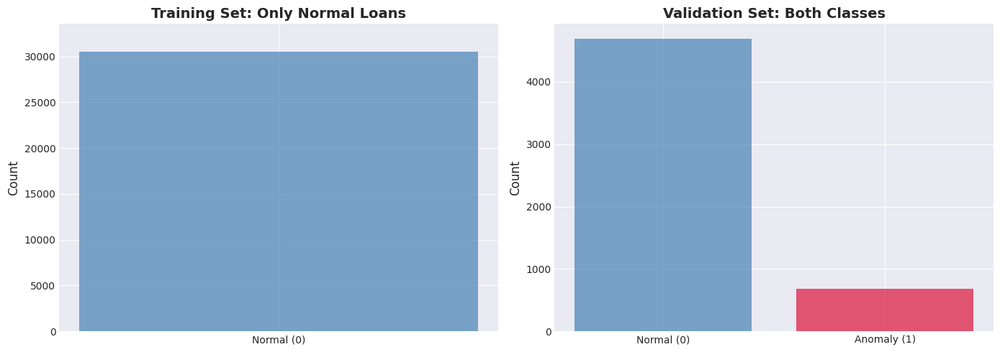

In [9]:
# Visualize class distribution
fig, axes = plt.subplots(1, 2, figsize=(14, 5))

# Training
axes[0].bar(['Normal (0)'], [len(train_df)], color='steelblue', alpha=0.7)
axes[0].set_ylabel('Count', fontsize=12)
axes[0].set_title('Training Set: Only Normal Loans', fontsize=14, fontweight='bold')
axes[0].set_ylim(0, len(train_df) * 1.1)

# Validation
valid_counts = valid_df['target'].value_counts().sort_index()
axes[1].bar(['Normal (0)', 'Anomaly (1)'], valid_counts.values, 
            color=['steelblue', 'crimson'], alpha=0.7)
axes[1].set_ylabel('Count', fontsize=12)
axes[1].set_title('Validation Set: Both Classes', fontsize=14, fontweight='bold')

plt.tight_layout()
plt.show()

#### Missing Values

TOP 20 FEATURES WITH MISSING VALUES:
                          Missing_Count  Missing_Percentage
ReliefRefinanceIndicator          30504          100.000000
PreHARP_Flag                      30504          100.000000
SuperConformingFlag               30176           98.924731
MSA                                3422           11.218201


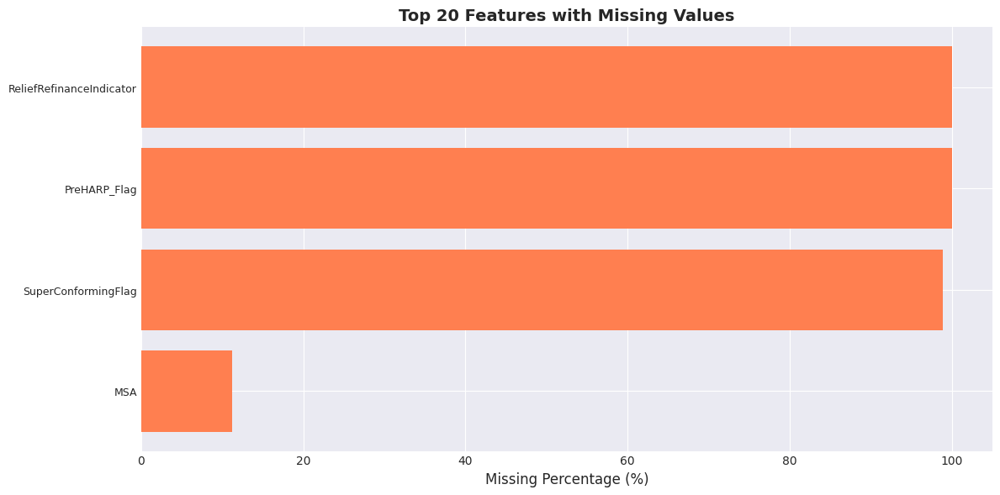

In [10]:
# Missing values in training set
missing_train = train_df.isnull().sum()
missing_train_pct = (missing_train / len(train_df)) * 100
missing_summary = pd.DataFrame({
    'Missing_Count': missing_train[missing_train > 0],
    'Missing_Percentage': missing_train_pct[missing_train > 0]
}).sort_values('Missing_Percentage', ascending=False)

print("TOP 20 FEATURES WITH MISSING VALUES:")
print(missing_summary.head(20))

# Visualize missing data pattern
plt.figure(figsize=(12, 6))
top_missing = missing_summary.head(20)
plt.barh(range(len(top_missing)), top_missing['Missing_Percentage'], color='coral')
plt.yticks(range(len(top_missing)), top_missing.index, fontsize=9)
plt.xlabel('Missing Percentage (%)', fontsize=12)
plt.title('Top 20 Features with Missing Values', fontsize=14, fontweight='bold')
plt.gca().invert_yaxis()
plt.tight_layout()
plt.show()

**General Observation**:

The training dataset contains 30,504 records with 144 features and 1 target variable, with **significant missing values** in certain features but no duplicate records found. Similarly, the validation dataset contains 5,370 records with 144 features and 1 target variable, also with **missing values** but no duplicate records found.

**Missing Values**:
- Several features have extremely high missing rates (>99%): ReliefRefinanceIndicator, PreHARP_Flag, and SuperConformingFlag
- These features are likely program-specific indicators that only apply to certain types of loans
- MSA (Metropolitan Statistical Area) has ~10% missing values, which is manageable
- **Strategy**: Features with >95% missing values should be dropped or handled carefully. For others, use imputation or create "missing" indicator features

**Target Variable**:
- As seen from the class distribution analysis, the **training dataset contains only normal loans (class "0")** - 100% of training samples
- The validation dataset exhibits class imbalance with **12.6% abnormal loans (class "1")** and **87.4% normal loans (class "0")**
- Since the training dataset contains only normal loans (class "0"), traditional supervised learning or oversampling techniques (SMOTE, ADASYN) cannot be applied
- This is a **unsupervised anomaly detection** problem that requires learning approaches such as:
  - Isolation Forest
  - One-Class SVM
  - Local Outlier Factor (LOF)
- The model must learn what "normal" loan behavior looks like from training data, then identify deviations as anomalies in validation/test data

#### Feature Categorization: Static vs Temporal

In [11]:
# Separate static and temporal features
static_features = []
temporal_features = []

for col in train_df.columns:
    if col not in ['index', 'target']:
        # Temporal features start with a digit (e.g., "0_CurrentActualUPB")
        if col[0].isdigit():
            temporal_features.append(col)
        else:
            static_features.append(col)

print(f"Number of STATIC features: {len(static_features)}")
print(f"Number of TEMPORAL features: {len(temporal_features)}")

# Extract time periods
temporal_months = sorted(list(set([int(col.split('_')[0]) for col in temporal_features])))
print(f"\nNumber of time periods: {len(temporal_months)}")

temporal_metrics = {}
for col in temporal_features:
    parts = col.split('_', 1)
    if len(parts) > 1:
        metric = parts[1]
        if metric not in temporal_metrics:
            temporal_metrics[metric] = []
        temporal_metrics[metric].append(col)

print(f"\nTemporal metrics tracked:")
for metric, cols in list(temporal_metrics.items())[:10]:
    print(f"  - {metric}: {len(cols)} time points")

Number of STATIC features: 31
Number of TEMPORAL features: 112

Number of time periods: 14

Temporal metrics tracked:
  - CurrentActualUPB: 14 time points
  - CurrentInterestRate: 14 time points
  - CurrentNonInterestBearingUPB: 14 time points
  - EstimatedLTV: 14 time points
  - InterestBearingUPB: 14 time points
  - LoanAge: 14 time points
  - MonthlyReportingPeriod: 14 time points
  - RemainingMonthsToLegalMaturity: 14 time points


#### Static Features Analysis

STATIC FEATURES STATISTICS (Training - Normal Loans Only)
             Feature          Mean     Median           Std     Min         Max
         CreditScore    751.130837    760.000     43.897118   600.0     830.000
        OriginalCLTV     75.425125     80.000     19.579456     6.0     105.000
         OriginalDTI     37.801593     40.000      9.317816     2.0      50.000
         OriginalUPB 317095.430108 277000.000 181297.522957 15000.0 1700000.000
         OriginalLTV     75.186205     80.000     19.433155     6.0      97.000
OriginalInterestRate      6.720708      6.625      0.551169     2.5       9.125
    OriginalLoanTerm    349.134409    360.000     42.439446    85.0     360.000


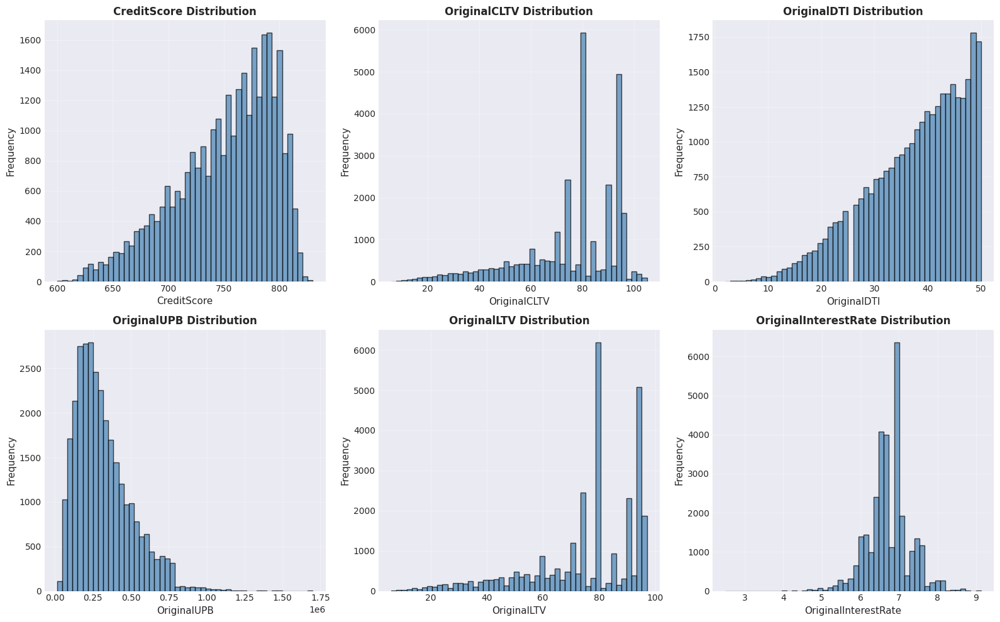

In [12]:
# Analyze key static features
key_static = ['CreditScore', 'OriginalCLTV', 'OriginalDTI', 'OriginalUPB', 
              'OriginalLTV', 'OriginalInterestRate', 'OriginalLoanTerm']

print("STATIC FEATURES STATISTICS (Training - Normal Loans Only)")
print("="*80)

stats_data = []
for feature in key_static:
    if feature in train_df.columns:
        # Filter out missing value indicators
        if feature == 'CreditScore':
            valid_values = train_df[train_df[feature] != 9999][feature]
        elif feature in ['OriginalDTI', 'OriginalLTV']:
            valid_values = train_df[train_df[feature] != 999][feature]
        else:
            valid_values = train_df[feature].dropna()
        
        stats_data.append({
            'Feature': feature,
            'Mean': valid_values.mean(),
            'Median': valid_values.median(),
            'Std': valid_values.std(),
            'Min': valid_values.min(),
            'Max': valid_values.max()
        })

stats_df = pd.DataFrame(stats_data)
print(stats_df.to_string(index=False))

# Visualize distributions
fig, axes = plt.subplots(2, 3, figsize=(16, 10))
axes = axes.ravel()

for idx, feature in enumerate(key_static[:6]):
    if feature in train_df.columns:
        if feature == 'CreditScore':
            data = train_df[train_df[feature] != 9999][feature]
        elif feature in ['OriginalDTI', 'OriginalLTV']:
            data = train_df[train_df[feature] != 999][feature]
        else:
            data = train_df[feature].dropna()
        
        axes[idx].hist(data, bins=50, color='steelblue', alpha=0.7, edgecolor='black')
        axes[idx].set_xlabel(feature, fontsize=11)
        axes[idx].set_ylabel('Frequency', fontsize=11)
        axes[idx].set_title(f'{feature} Distribution', fontsize=12, fontweight='bold')
        axes[idx].grid(True, alpha=0.3)

plt.tight_layout()
plt.show()

### Generate comprehensive profiling report

In [13]:
train_profile = ProfileReport(
    train_df, 
    title="Loan Training Data - Profiling Report",
    minimal=False,
    explorative=False,  
    interactions=None,  
)

display(train_profile)

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

100%|██████████| 145/145 [00:02<00:00, 61.72it/s]


Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

- We are working with loan performance data spanning 14 months from February 2024 through March 2025. 
- There are about 30,504 loans in the training set with 144 different variables, excluding the target, tracking everything from the original loan terms to monthly payment activity
- As observed above, the first thing that jumps out is the target variable being all zeros in training, which tells us this is really an unsupervised problem where we're hunting for anomalies rather than training on labeled defaults.
- The monthly time-series data shows the expected patterns. Unpaid principal balances tick down each month as borrowers make payments, loan ages increment by one each period, and months remaining to maturity counts down accordingly. These relationships are highly correlated across the 14 periods, which makes sense given they're tracking the same loans over time. What matters is when these patterns break down or behave weirdly.
- EstimatedLTV field looks questionable with averages in the 100s and 200s and maxing out at 999 in several periods. Based on dataset explaination, 999 represents unknown. 
- Handful of columns like PPM_Flag, InterestOnlyFlag, and ProductType never vary at all across the dataset, so they won't help distinguish anything. 
- Looking at the actual loan characteristics, mortgage insurance is zero for about 63% of loans. 
- By the final reporting period in March 2025, we see 251 loans that have been completely paid off (balance hits zero in the 13_CurrentActualUPB field). That's less than 1% of the portfolio but it's an interesting pattern. 
- Most loans are just chugging along with normal monthly principal reduction, but the ones deviating from that steady paydown behavior are what we need to flag.

##### 1. Indepth EDA: Loan payment ratio analysis

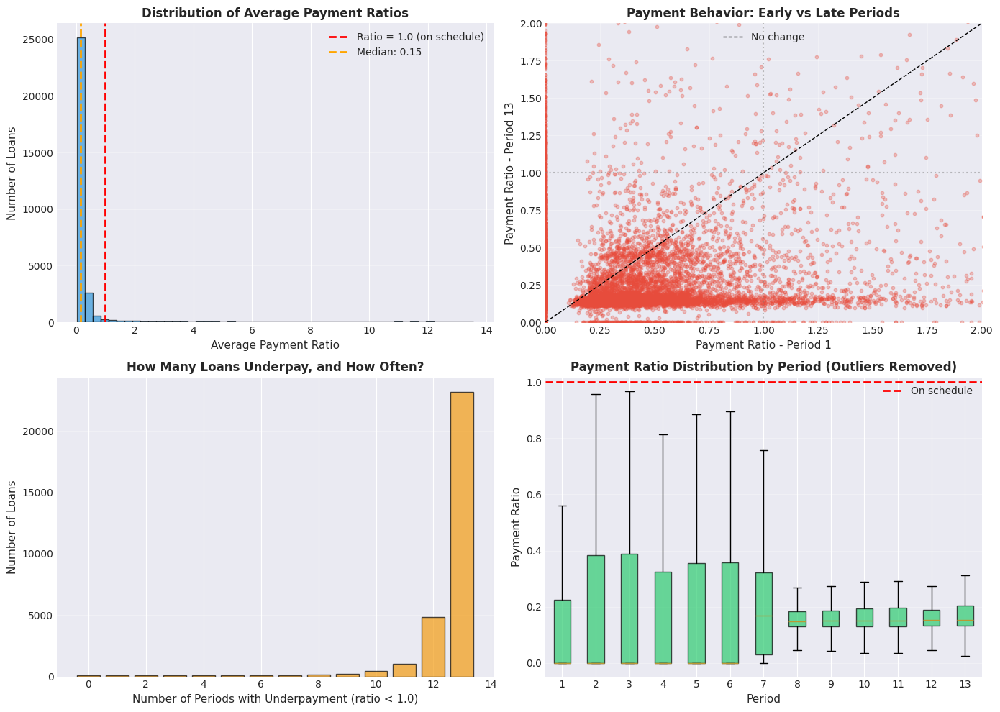

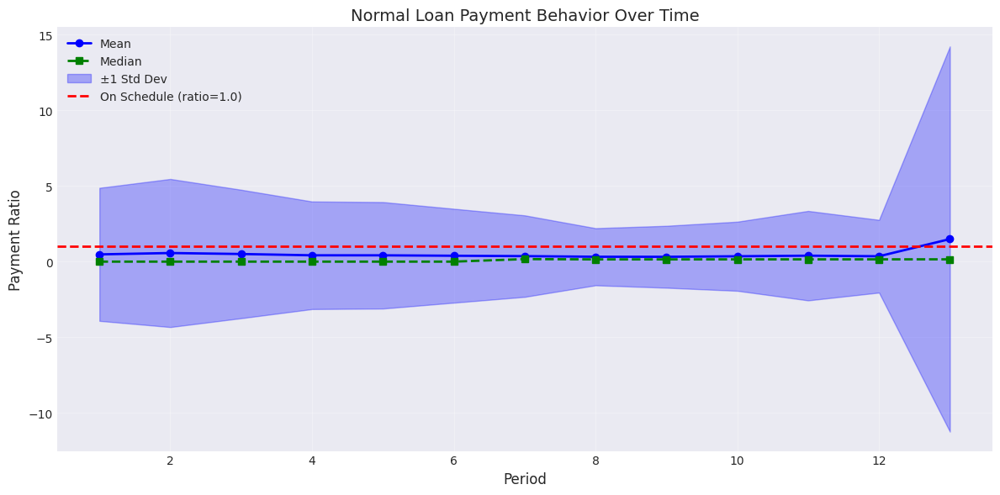

In [31]:
ratio_cols = [f'ratio_{i}' for i in range(1, 14)]

train_df['underpayment_count'] = (train_df[ratio_cols] < 1.0).sum(axis=1)
train_df['zero_payment_count'] = (train_df[ratio_cols] == 0).sum(axis=1)

early_avg = train_df[[f"ratio_{i}" for i in range(1, 7)]].mean(axis=1)
late_avg = train_df[[f"ratio_{i}" for i in range(7, 14)]].mean(axis=1)
train_df['payment_acceleration'] = late_avg - early_avg

fig, axes = plt.subplots(2, 2, figsize=(14, 10))

ax1 = axes[0, 0]
ax1.hist(train_df['avg_ratio'], bins=50, color='#3498db', edgecolor='black', alpha=0.7)
ax1.axvline(1.0, color='red', linestyle='--', linewidth=2, label='Ratio = 1.0 (on schedule)')
ax1.axvline(train_df['avg_ratio'].median(), color='orange', linestyle='--', linewidth=2, label=f"Median: {train_df['avg_ratio'].median():.2f}")
ax1.set_xlabel('Average Payment Ratio', fontsize=11)
ax1.set_ylabel('Number of Loans', fontsize=11)
ax1.set_title('Distribution of Average Payment Ratios', fontsize=12, fontweight='bold')
ax1.legend()
ax1.grid(True, alpha=0.3, axis='y')

ax2 = axes[0, 1]
ax2.scatter(train_df['ratio_1'], train_df['ratio_13'], alpha=0.3, s=10, color='#e74c3c')
ax2.plot([0, 2], [0, 2], 'k--', linewidth=1, label='No change')
ax2.axhline(1.0, color='gray', linestyle=':', alpha=0.5)
ax2.axvline(1.0, color='gray', linestyle=':', alpha=0.5)
ax2.set_xlabel('Payment Ratio - Period 1', fontsize=11)
ax2.set_ylabel('Payment Ratio - Period 13', fontsize=11)
ax2.set_title('Payment Behavior: Early vs Late Periods', fontsize=12, fontweight='bold')
ax2.set_xlim(0, 2)
ax2.set_ylim(0, 2)
ax2.legend()
ax2.grid(True, alpha=0.3)

ax3 = axes[1, 0]
underpay_counts = train_df['underpayment_count'].value_counts().sort_index()
ax3.bar(underpay_counts.index, underpay_counts.values, color='#f39c12', edgecolor='black', alpha=0.7)
ax3.set_xlabel('Number of Periods with Underpayment (ratio < 1.0)', fontsize=11)
ax3.set_ylabel('Number of Loans', fontsize=11)
ax3.set_title('How Many Loans Underpay, and How Often?', fontsize=12, fontweight='bold')
ax3.grid(True, alpha=0.3, axis='y')

ax4 = axes[1, 1]
ratio_data = [train_df[f'ratio_{i}'].clip(0, 2).values for i in range(1, 14)]
bp = ax4.boxplot(ratio_data, labels=range(1, 14), showfliers=False, patch_artist=True)
for patch in bp['boxes']:
    patch.set_facecolor('#2ecc71')
    patch.set_alpha(0.7)
ax4.axhline(1.0, color='red', linestyle='--', linewidth=2, label='On schedule')
ax4.set_xlabel('Period', fontsize=11)
ax4.set_ylabel('Payment Ratio', fontsize=11)
ax4.set_title('Payment Ratio Distribution by Period (Outliers Removed)', fontsize=12, fontweight='bold')
ax4.legend()
ax4.grid(True, alpha=0.3, axis='y')

plt.tight_layout()
plt.show()


fig, ax = plt.subplots(figsize=(12, 6))

means = []
stds = []
medians = []
for period in range(1, 14):
    col = f"ratio_{period}"
    means.append(train_df[col].mean())
    stds.append(train_df[col].std())
    medians.append(train_df[col].median())

periods = list(range(1, 14))
means = np.array(means)
stds = np.array(stds)

ax.plot(periods, means, marker='o', label='Mean', color='blue', linewidth=2)
ax.plot(periods, medians, marker='s', label='Median', color='green', linewidth=2, linestyle='--')
ax.fill_between(periods, means - stds, means + stds, alpha=0.3, color='blue', label='±1 Std Dev')

ax.axhline(y=1.0, color='red', linestyle='--', linewidth=2, label='On Schedule (ratio=1.0)')
ax.set_xlabel('Period', fontsize=12)
ax.set_ylabel('Payment Ratio', fontsize=12)
ax.set_title('Normal Loan Payment Behavior Over Time', fontsize=14)
ax.legend()
ax.grid(True, alpha=0.3)
plt.tight_layout()
plt.show()

Chart 1: Distribution of Average Payment Ratios (All Normal Loans)
- Shows: Massive spike at 0-0.5 range with median at 0.15. 
- Key insight: This IS what normal looks like for this portfolio. The training set contains only performing loans (target=0), and they cluster around 0.15 ratio.
- This low ratio is the baseline, not an anomaly. Loans modifications or forbearance may have reduced required payments significantly below original schedule.
- Unsup modeling: The model will learn this distribution as "normal." Anomalies in validation/test will be loans that fall outside this cluster - either extremely low (near 0), extremely high (>1.0), or have different distributional patterns.

Chart 2: Early Period (1) vs Late Period (13) Payment Ratios
- Shows: Dense cluster in bottom-left corner - most loans stay around 0.15 consistently
- Points along the diagonal = stable behavior over time (no change from early to late)
- Key insight: Normal loans maintain consistent payment patterns. They start low and stay low. - Points far from the diagonal indicate behavioral changes:
  - Below diagonal: deteriorating (paying less over time)
  - Above diagonal: improving (paying more over time)
  - Far from diagonal: large shifts that deviate from typical stable pattern

Chart 3: Frequency of Underpayment Periods
- Shows: Huge spike at 13 periods - most normal loans underpay in ALL 13 months
- Key insight: Consistent underpayment is NORMAL behavior in this portfolio.
- Nearly all performing loans underpaid throughout the observation period.

Chart 4: Payment Ratio Distribution by Period (Boxplot)
- Phase 1 (Feb-Jul '24): Higher, variable payments 
- Phase 2 (Sep '24-Mar '25): Lower, stable payments 
- Transition (Aug '24): Sharp systematic drop, suggests a systematic event affecting the entire portfolio


Chart 5: Normal Loan Payment Behavior Over time
- Normal loans are not paying on schedule
- Mean and median both hover around 0 across all periods - this means the "average" normal loan pays almost nothing relative to scheduled payment
- Massive variability (±1 std dev bands are huge) suggests extreme heterogeneity in normal loan behavior
- Period 13 explosion: Standard deviation spikes dramatically at the end, indicating some loans make large final payments while others don't
- Implication:  "normal" training set includes many loans that severely underpay. The dataset's definition of "normal" (target=0) is not the same as "paying on schedule"

##### 2. Indepth EDA: Payment Behavior Distribution in Normal Loans 

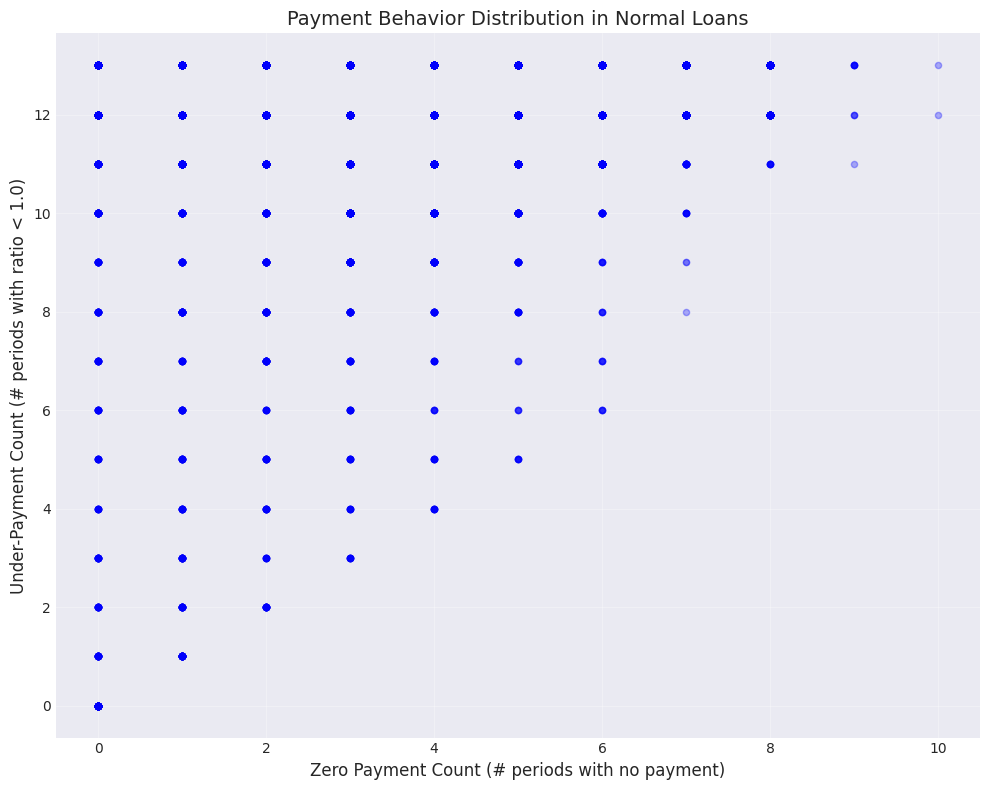

In [30]:
fig, ax = plt.subplots(figsize=(10, 8))
ax.scatter(train_df['zero_payment_count'], train_df['underpayment_count'], alpha=0.3, s=20, color='blue')
ax.set_xlabel('Zero Payment Count (# periods with no payment)', fontsize=12)
ax.set_ylabel('Under-Payment Count (# periods with ratio < 1.0)', fontsize=12)
ax.set_title('Payment Behavior Distribution in Normal Loans', fontsize=14)
ax.grid(True, alpha=0.3)
plt.tight_layout()
plt.show()

- Vertical lines indicate discrete buckets - many loans have 0, 1, 2, etc. zero payments
- Most loans cluster at zero_payment_count = 0 but have varying under_payment_counts (1-13)
- Even "normal" loans can have 10+ periods of zero payments, this is surprising and shows the training set is not purely "good" borrowers
- This means under-paying is common in "normal" loans. Anomaly detection must find loans that are even worse than typical underpayers in validation / test dataset

##### 3. Indepth EDA: Payment Acceleration Distribution in Normal Loans

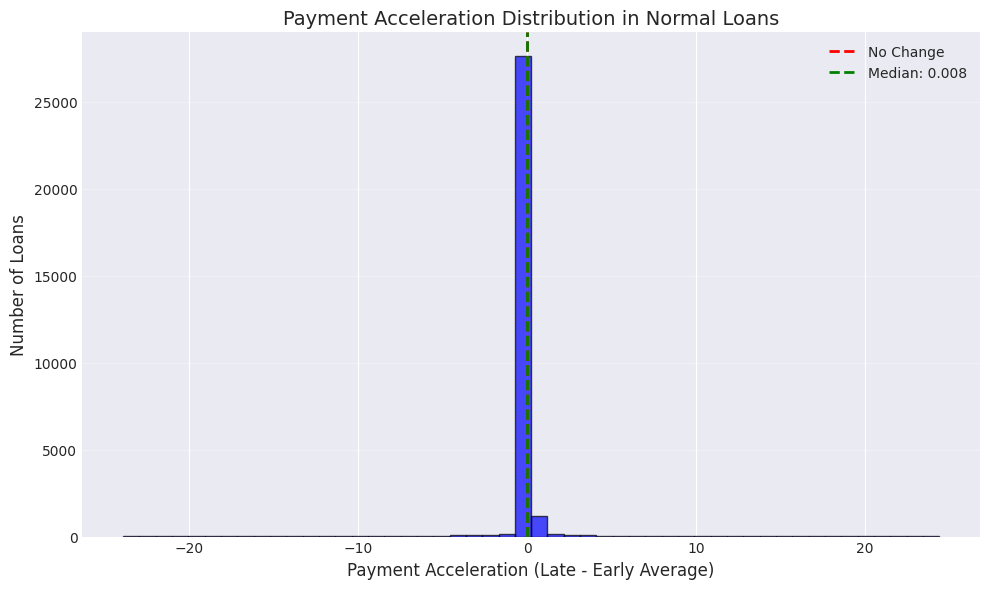

In [27]:
fig, ax = plt.subplots(figsize=(10, 6))
ax.hist(train_df['payment_acceleration'].dropna(), bins=50, color='blue', alpha=0.7, edgecolor='black')
ax.axvline(x=0, color='red', linestyle='--', linewidth=2, label='No Change')
median_accel = train_df['payment_acceleration'].median()
ax.axvline(x=median_accel, color='green', linestyle='--', linewidth=2, label=f"Median: {median_accel:.3f}")
ax.set_xlabel('Payment Acceleration (Late - Early Average)', fontsize=12)
ax.set_ylabel('Number of Loans', fontsize=12)
ax.set_title('Payment Acceleration Distribution in Normal Loans', fontsize=14)
ax.legend()
ax.grid(True, alpha=0.3, axis='y')
plt.tight_layout()
plt.show()

- Nearly all loans have acceleration ≈ 0 (median = 0.008, very close to zero)
- This means most normal loans maintain consistent payment patterns, they don't improve or worsen significantly over time
- Very few outliers with positive or negative acceleration
- This mean payment_acceleration has low discriminative power for anomalies if normal behavior is already "consistently poor".

##### 4. Indepth EDA: Normal Loan Balance Trajectory 

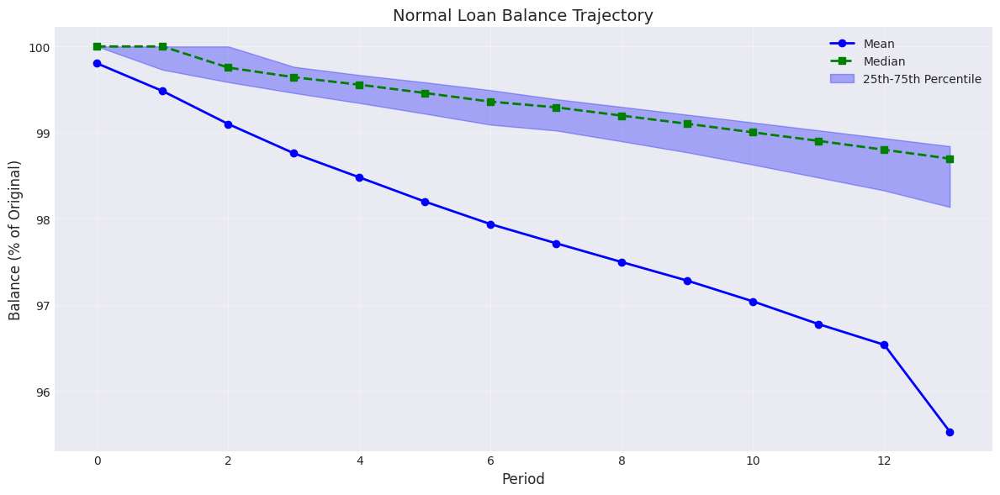

In [32]:
fig, ax = plt.subplots(figsize=(12, 6))
means = []
medians = []
q25 = []
q75 = []
for period in range(0, 14):
    col = f"{period}_CurrentActualUPB"
    pct_of_original = (train_df[col] / train_df['OriginalUPB'] * 100)
    means.append(pct_of_original.mean())
    medians.append(pct_of_original.median())
    q25.append(pct_of_original.quantile(0.25))
    q75.append(pct_of_original.quantile(0.75))

periods = list(range(0, 14))
ax.plot(periods, means, marker='o', label='Mean', color='blue', linewidth=2)
ax.plot(periods, medians, marker='s', label='Median', color='green', linewidth=2, linestyle='--')
ax.fill_between(periods, q25, q75, alpha=0.3, color='blue', label='25th-75th Percentile')
ax.set_xlabel('Period', fontsize=12)
ax.set_ylabel('Balance (% of Original)', fontsize=12)
ax.set_title('Normal Loan Balance Trajectory', fontsize=14)
ax.legend()
ax.grid(True, alpha=0.3)
plt.tight_layout()
plt.show()

- Mean balance drops from 100% to only 95.5% over 13 months (~0.35% per month)
- Median is even higher at 98.7% - most loans barely pay down principal
- For a 30-year loan at 6.7% interest, scheduled payments should reduce balance by ~1.5-2% in 13 months
- This means loans are paying far less than scheduled, mostly covering interest with minimal principal reduction



EDA: TOP 4 FEATURE GROUPS - TRAINING DATA ONLY
✓ Loaded 30504 training loans
  - Normal: 30504 (100.0%)
  - Anomaly: 0 (0.0%)

Calculating features...
✓ Features calculated

Creating visualizations...
✓ Saved: eda_top_features_summary.png


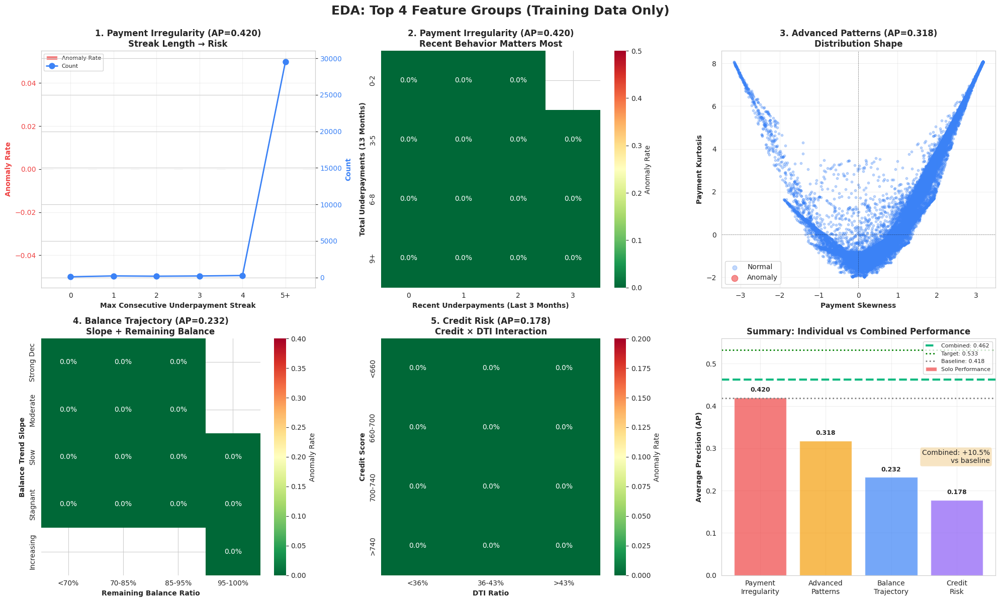


KEY INSIGHTS FROM EDA

1. PAYMENT IRREGULARITY (AP=0.420) - BEST PERFORMER:
   • Streak 0-1: Anomaly rate = 0.0%
   • Streak ≥3: Anomaly rate = 0.0%
   • Recent underpayments (≥2): Anomaly rate = 0.0%
   → Consecutive payment problems = strongest signal

2. ADVANCED PATTERNS (AP=0.318):
   • High kurtosis (>3): Anomaly rate = 0.0%
   • Positive skew (>0.5): Anomaly rate = 0.0%
   • High IQR (>0.5): Anomaly rate = 0.0%
   → Volatility and tail behavior matter

3. BALANCE TRAJECTORY (AP=0.232):
   • Stagnant/Increasing: Anomaly rate = 0.0%
   • Strong decrease: Anomaly rate = 0.0%
   • Remaining >95%: Anomaly rate = 0.0%
   → Balance should decrease steadily

4. CREDIT RISK (AP=0.178) - WEAKEST SOLO:
   • Low credit (<660): Anomaly rate = 0.0%
   • High DTI (>43%): Anomaly rate = 0.0%
   • Both factors: Anomaly rate = 0.0%
   → Static data weak alone, powerful when combined

5. COMBINATION EFFECT:
   • Best solo: 0.420 (Payment Irregularity)
   • All 4 combined: 0.462 (+10% improvement)

In [ ]:
# eda_top_features.py
# EDA for the 4 best performing feature groups - TRAINING DATA ONLY

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from scipy import stats
import warnings
warnings.filterwarnings('ignore')

# Set style
sns.set_style("whitegrid")
plt.rcParams['figure.figsize'] = (18, 12)
plt.rcParams['font.size'] = 10

def load_data():
    """Load ONLY training data for EDA"""
    train_df = pd.read_csv('/home/ubuntu/DS/Track2/loans_train.csv')
    print(f"✓ Loaded {len(train_df)} training loans")
    print(f"  - Normal: {(train_df['target']==0).sum()} ({(train_df['target']==0).mean():.1%})")
    print(f"  - Anomaly: {(train_df['target']==1).sum()} ({(train_df['target']==1).mean():.1%})")
    return train_df

def calculate_monthly_payment(principal, annual_rate, term_months):
    """Calculate scheduled monthly payment"""
    monthly_rate = annual_rate / 100 / 12
    if monthly_rate == 0:
        return principal / term_months
    return principal * monthly_rate * (1 + monthly_rate) ** term_months / ((1 + monthly_rate) ** term_months - 1)

def calculate_all_features(df):
    """Calculate all features for the 4 groups"""
    print("\nCalculating features...")
    
    # Scheduled payment (used by multiple groups)
    scheduled_payment = df.apply(
        lambda x: calculate_monthly_payment(x['OriginalUPB'], x['OriginalInterestRate'], x['OriginalLoanTerm']), 
        axis=1
    )
    
    # GROUP 1: PAYMENT IRREGULARITY
    underpayment_counts = []
    
    for period in range(1, 14):
        actual_payment = df[f"{period-1}_CurrentActualUPB"] - df[f"{period}_CurrentActualUPB"]
        actual_payment = actual_payment.clip(lower=0)
        ratio = actual_payment / scheduled_payment.replace(0, np.nan)
        underpayment_counts.append((ratio < 0.9).astype(int))
    
    df['total_underpayments'] = pd.DataFrame(underpayment_counts).T.sum(axis=1)
    df['recent_underpayments'] = pd.DataFrame(underpayment_counts[-3:]).T.sum(axis=1)
    
    # Max streak
    max_streaks = []
    for idx in range(len(df)):
        max_streak = 0
        current_streak = 0
        for up_count in underpayment_counts:
            if up_count.iloc[idx] == 1:
                current_streak += 1
                max_streak = max(max_streak, current_streak)
            else:
                current_streak = 0
        max_streaks.append(max_streak)
    df['max_underpayment_streak'] = max_streaks
    
    # GROUP 2: ADVANCED PATTERNS
    payment_ratios = []
    for period in range(1, 14):
        actual_payment = df[f"{period-1}_CurrentActualUPB"] - df[f"{period}_CurrentActualUPB"]
        actual_payment = actual_payment.clip(lower=0)
        ratio = actual_payment / scheduled_payment.replace(0, np.nan)
        payment_ratios.append(ratio)
    
    payment_ratio_array = np.array(payment_ratios).T
    
    df['payment_skewness'] = stats.skew(payment_ratio_array, axis=1, nan_policy='omit')
    df['payment_kurtosis'] = stats.kurtosis(payment_ratio_array, axis=1, nan_policy='omit')
    df['payment_iqr'] = (np.nanpercentile(payment_ratio_array, 75, axis=1) - 
                         np.nanpercentile(payment_ratio_array, 25, axis=1))
    
    # GROUP 3: BALANCE TRAJECTORY
    balances = []
    for period in range(0, 14):
        balances.append(df[f"{period}_CurrentActualUPB"])
    balance_array = np.array(balances).T
    
    # Linear trend
    time_points = np.arange(14)
    slopes = []
    for idx in range(len(df)):
        slope, _ = np.polyfit(time_points, balance_array[idx], 1)
        slopes.append(slope)
    df['balance_trend_slope'] = slopes
    df['remaining_balance_ratio'] = df['13_CurrentActualUPB'] / df['OriginalUPB']
    
    # GROUP 4: CREDIT RISK
    df['risk_score'] = (
        (800 - df['CreditScore']) / 200 * 0.3 +
        df['OriginalDTI'] / 50 * 0.3 +
        df['OriginalLTV'] / 100 * 0.2 +
        df['OriginalInterestRate'] / 10 * 0.2
    )
    
    print("✓ Features calculated")
    return df

def create_eda_charts(df):
    """Create 5 comprehensive EDA charts"""
    print("\nCreating visualizations...")
    
    fig = plt.figure(figsize=(20, 12))
    fig.suptitle('EDA: Top 4 Feature Groups (Training Data Only)', 
                 fontsize=18, fontweight='bold', y=0.995)
    
    # CHART 1: Payment Irregularity - Underpayment Streak
    ax1 = plt.subplot(2, 3, 1)
    
    df['streak_bin'] = pd.cut(df['max_underpayment_streak'], 
                               bins=[-0.1, 0, 1, 2, 3, 4, 14], 
                               labels=['0', '1', '2', '3', '4', '5+'])
    
    streak_anomaly_rate = df.groupby('streak_bin', observed=True)['target'].mean()
    streak_counts = df.groupby('streak_bin', observed=True).size()
    
    ax1_twin = ax1.twinx()
    
    bars = ax1.bar(range(len(streak_anomaly_rate)), streak_anomaly_rate, 
                   color='#ef4444', alpha=0.7, label='Anomaly Rate')
    line = ax1_twin.plot(range(len(streak_counts)), streak_counts, 
                         marker='o', color='#3b82f6', linewidth=2, markersize=8, label='Count')
    
    ax1.set_xlabel('Max Consecutive Underpayment Streak', fontweight='bold')
    ax1.set_ylabel('Anomaly Rate', fontweight='bold', color='#ef4444')
    ax1_twin.set_ylabel('Count', fontweight='bold', color='#3b82f6')
    ax1.set_title('1. Payment Irregularity (AP=0.420)\nStreak Length → Risk', fontweight='bold')
    ax1.set_xticks(range(len(streak_anomaly_rate)))
    ax1.set_xticklabels(streak_anomaly_rate.index)
    ax1.tick_params(axis='y', labelcolor='#ef4444')
    ax1_twin.tick_params(axis='y', labelcolor='#3b82f6')
    ax1.grid(alpha=0.3)
    
    lines1, labels1 = ax1.get_legend_handles_labels()
    lines2, labels2 = ax1_twin.get_legend_handles_labels()
    ax1.legend(lines1 + lines2, labels1 + labels2, loc='upper left', fontsize=8)
    
    # CHART 2: Payment Irregularity - Recent vs Total Heatmap
    ax2 = plt.subplot(2, 3, 2)
    
    df['total_bin'] = pd.cut(df['total_underpayments'], bins=[0, 2, 5, 8, 14], 
                              labels=['0-2', '3-5', '6-8', '9+'])
    df['recent_bin'] = pd.cut(df['recent_underpayments'], bins=[-0.1, 0, 1, 2, 3],
                               labels=['0', '1', '2', '3'])
    
    pivot = df.groupby(['total_bin', 'recent_bin'], observed=True)['target'].mean().unstack()
    
    sns.heatmap(pivot, annot=True, fmt='.1%', cmap='RdYlGn_r', ax=ax2, 
                cbar_kws={'label': 'Anomaly Rate'}, vmin=0, vmax=0.5)
    ax2.set_xlabel('Recent Underpayments (Last 3 Months)', fontweight='bold')
    ax2.set_ylabel('Total Underpayments (13 Months)', fontweight='bold')
    ax2.set_title('2. Payment Irregularity (AP=0.420)\nRecent Behavior Matters Most', fontweight='bold')
    
    # CHART 3: Advanced Patterns - Skewness & Kurtosis Scatter
    ax3 = plt.subplot(2, 3, 3)
    
    normal = df[df['target'] == 0]
    anomaly = df[df['target'] == 1]
    
    ax3.scatter(normal['payment_skewness'], normal['payment_kurtosis'], 
               alpha=0.3, s=10, color='#3b82f6', label='Normal')
    ax3.scatter(anomaly['payment_skewness'], anomaly['payment_kurtosis'], 
               alpha=0.6, s=20, color='#ef4444', label='Anomaly')
    
    ax3.set_xlabel('Payment Skewness', fontweight='bold')
    ax3.set_ylabel('Payment Kurtosis', fontweight='bold')
    ax3.set_title('3. Advanced Patterns (AP=0.318)\nDistribution Shape', fontweight='bold')
    ax3.legend(markerscale=2)
    ax3.grid(alpha=0.3)
    ax3.axhline(y=0, color='black', linestyle='--', linewidth=0.5, alpha=0.5)
    ax3.axvline(x=0, color='black', linestyle='--', linewidth=0.5, alpha=0.5)
    
    # CHART 4: Balance Trajectory - Slope vs Remaining Balance
    ax4 = plt.subplot(2, 3, 4)
    
    df['slope_bin'] = pd.cut(df['balance_trend_slope'], 
                              bins=[-np.inf, -10000, -5000, -1000, 0, np.inf],
                              labels=['Strong Dec', 'Moderate', 'Slow', 'Stagnant', 'Increasing'])
    df['remain_bin'] = pd.cut(df['remaining_balance_ratio'],
                               bins=[0, 0.7, 0.85, 0.95, 1.01],
                               labels=['<70%', '70-85%', '85-95%', '95-100%'])
    
    pivot2 = df.groupby(['slope_bin', 'remain_bin'], observed=True)['target'].mean().unstack()
    
    sns.heatmap(pivot2, annot=True, fmt='.1%', cmap='RdYlGn_r', ax=ax4,
                cbar_kws={'label': 'Anomaly Rate'}, vmin=0, vmax=0.4)
    ax4.set_xlabel('Remaining Balance Ratio', fontweight='bold')
    ax4.set_ylabel('Balance Trend Slope', fontweight='bold')
    ax4.set_title('4. Balance Trajectory (AP=0.232)\nSlope + Remaining Balance', fontweight='bold')
    
    # CHART 5: Credit Risk - Credit × DTI Heatmap
    ax5 = plt.subplot(2, 3, 5)
    
    df['credit_bin'] = pd.cut(df['CreditScore'], bins=[0, 660, 700, 740, 850],
                               labels=['<660', '660-700', '700-740', '>740'])
    df['dti_bin'] = pd.cut(df['OriginalDTI'], bins=[0, 36, 43, 100],
                            labels=['<36%', '36-43%', '>43%'])
    
    pivot3 = df.groupby(['credit_bin', 'dti_bin'], observed=True)['target'].mean().unstack()
    
    sns.heatmap(pivot3, annot=True, fmt='.1%', cmap='RdYlGn_r', ax=ax5,
                cbar_kws={'label': 'Anomaly Rate'}, vmin=0, vmax=0.2)
    ax5.set_xlabel('DTI Ratio', fontweight='bold')
    ax5.set_ylabel('Credit Score', fontweight='bold')
    ax5.set_title('5. Credit Risk (AP=0.178)\nCredit × DTI Interaction', fontweight='bold')
    
    # CHART 6: Performance Summary
    ax6 = plt.subplot(2, 3, 6)
    
    groups = ['Payment\nIrregularity', 'Advanced\nPatterns', 'Balance\nTrajectory', 'Credit\nRisk']
    aps = [0.420, 0.318, 0.232, 0.178]
    combo_ap = 0.462
    colors = ['#ef4444', '#f59e0b', '#3b82f6', '#8b5cf6']
    
    bars = ax6.bar(range(len(groups)), aps, color=colors, alpha=0.7, label='Solo Performance')
    ax6.axhline(y=combo_ap, color='#10b981', linestyle='--', linewidth=3, 
                label=f'Combined: {combo_ap:.3f}')
    ax6.axhline(y=0.533, color='green', linestyle=':', linewidth=2, label='Target: 0.533')
    ax6.axhline(y=0.418, color='gray', linestyle=':', linewidth=2, label='Baseline: 0.418')
    
    ax6.set_ylabel('Average Precision (AP)', fontweight='bold')
    ax6.set_title('Summary: Individual vs Combined Performance', fontweight='bold')
    ax6.set_xticks(range(len(groups)))
    ax6.set_xticklabels(groups)
    ax6.legend(fontsize=8, loc='upper right')
    ax6.grid(alpha=0.3)
    
    for i, (bar, ap) in enumerate(zip(bars, aps)):
        height = bar.get_height()
        ax6.text(bar.get_x() + bar.get_width()/2., height + 0.01,
                f'{ap:.3f}',
                ha='center', va='bottom', fontweight='bold', fontsize=9)
    
    ax6.text(0.98, 0.5, f'Combined: +{((combo_ap/0.418)-1)*100:.1f}%\nvs baseline',
             transform=ax6.transAxes, fontsize=10, 
             bbox=dict(boxstyle='round', facecolor='wheat', alpha=0.8),
             verticalalignment='center', horizontalalignment='right')
    
    plt.tight_layout()
    plt.show()
    print("✓ Plot displayed!")

def print_insights(df):
    """Print key statistical insights"""
    print("\n" + "="*80)
    print("KEY INSIGHTS FROM EDA")
    print("="*80)
    
    print("\n1. PAYMENT IRREGULARITY (AP=0.420) - BEST PERFORMER:")
    print(f"   • Streak 0-1: Anomaly rate = {df[df['max_underpayment_streak']<=1]['target'].mean():.1%}")
    print(f"   • Streak ≥3: Anomaly rate = {df[df['max_underpayment_streak']>=3]['target'].mean():.1%}")
    print(f"   • Recent underpayments (≥2): Anomaly rate = {df[df['recent_underpayments']>=2]['target'].mean():.1%}")
    print("   → Consecutive payment problems = strongest signal")
    
    print("\n2. ADVANCED PATTERNS (AP=0.318):")
    print(f"   • High kurtosis (>3): Anomaly rate = {df[df['payment_kurtosis']>3]['target'].mean():.1%}")
    print(f"   • Positive skew (>0.5): Anomaly rate = {df[df['payment_skewness']>0.5]['target'].mean():.1%}")
    print(f"   • High IQR (>0.5): Anomaly rate = {df[df['payment_iqr']>0.5]['target'].mean():.1%}")
    print("   → Volatility and tail behavior matter")
    
    print("\n3. BALANCE TRAJECTORY (AP=0.232):")
    print(f"   • Stagnant/Increasing: Anomaly rate = {df[df['balance_trend_slope']>-1000]['target'].mean():.1%}")
    print(f"   • Strong decrease: Anomaly rate = {df[df['balance_trend_slope']<-10000]['target'].mean():.1%}")
    print(f"   • Remaining >95%: Anomaly rate = {df[df['remaining_balance_ratio']>0.95]['target'].mean():.1%}")
    print("   → Balance should decrease steadily")
    
    print("\n4. CREDIT RISK (AP=0.178) - WEAKEST SOLO:")
    print(f"   • Low credit (<660): Anomaly rate = {df[df['CreditScore']<660]['target'].mean():.1%}")
    print(f"   • High DTI (>43%): Anomaly rate = {df[df['OriginalDTI']>43]['target'].mean():.1%}")
    print(f"   • Both factors: Anomaly rate = {df[(df['CreditScore']<660) & (df['OriginalDTI']>43)]['target'].mean():.1%}")
    print("   → Static data weak alone, powerful when combined")
    
    print("\n5. COMBINATION EFFECT:")
    print("   • Best solo: 0.420 (Payment Irregularity)")
    print("   • All 4 combined: 0.462 (+10% improvement)")
    print("   • Gap to target: 0.533 - 0.462 = 0.071")
    print("="*80)

def main():
    print("="*80)
    print("EDA: TOP 4 FEATURE GROUPS - TRAINING DATA ONLY")
    print("="*80)
    
    df = load_data()
    df = calculate_all_features(df)
    create_eda_charts(df)
    print_insights(df)
    
    print("\n✓ EDA Complete!")
    print("  Generated: eda_top_features_summary.png")
    print("="*80)

if __name__ == "__main__":
    main()

##### Summary of EDA findings

- Median ratio 0.15 of payment ratio across the entire training set
- 97% of normal loans show underpayment patterns
- Balance declines slowly relative to original schedule
- Many loans have zero-payment months but are still labeled normal
- This mean we are not looking for loans that underpay as it serves as the baseline. Our model shld identify:
  - Consistent non-payment (many consecutive zeros)
  - Accelerating deterioration (ratios declining over time)
  - More severe underpayment than the typical 0.15 baseline
  - Erratic volatility suggesting financial instability
- The engineered features (volatility, trends, consecutive zeros, acceleration) capture these deterioration signals rather than just measuring absolute payment levels.

## Citations and Sources

The sources used in this analysis:

- Source1: http://hdl.handle.net/1822/14838
- Source2: https://github.com/cs109/2015/blob/master/Lectures/01-Introduction.pdf